# 1.Preparing Data Sets:
   
   
     There are three datasets which consists annual results of madhya pradesh government schools.These data sets can be 
     analyzed in following aspects:
        * Number of students of particular grades based on there results.
        * Seprate number of boys and girls consisting same grade.
        * Total Enrollments of particular year.
        * Total students who appeared in annual exam in a particular year.
        * Total Girls and boys who enrolled and apppeared in annual exam.
      These datasets can be analysed based on districts,year and gender wise

In [1]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

In [2]:
#reading files
annual_result_2014_15 = pd.read_csv('H:\datasets@CivilLabs\district wise annual results\district annual results 2014-15.csv').dropna()
annual_result_2015_16 = pd.read_csv('H:\datasets@CivilLabs\district wise annual results\district annual results 2015-16.csv').dropna()
annual_result_2016_17 = pd.read_csv('H:\datasets@CivilLabs\district wise annual results\district annual results 2016-17.csv').dropna()

In [3]:
#cleaning datasets
annual_result_2014_15 = annual_result_2014_15.loc[:, ~annual_result_2015_16.columns.str.contains('^Unnamed')]
annual_result_2015_16 = annual_result_2015_16.loc[:, ~annual_result_2015_16.columns.str.contains('^Unnamed')]
annual_result_2016_17 = annual_result_2016_17.loc[:, ~annual_result_2016_17.columns.str.contains('^Unnamed')]
annual_result_2014_15 = annual_result_2014_15.drop(annual_result_2014_15.index[51])
annual_result_2015_16 = annual_result_2015_16.drop(annual_result_2015_16.index[51])
annual_result_2016_17 = annual_result_2016_17.drop(annual_result_2016_17.index[51])

## 2.Exploring DataSets:

In [4]:
annual_result_2014_15.describe()

,Total Enrollment,Total Enrollment Boys,Total Enrollment Girls,Total Appeared,Total Boys,Total Girls,A Grade Boys,A Grade Girls,B Grade Boys,B Grade Girls,C Grade Boys,C Grade Girls,D Grade Boys,D Grade Girls,E Grade Boys,E Grade Girls
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,95016.470588,47417.960784,47598.509804,90297.686275,44959.333333,45338.352941,5843.078431,5892.039216,19307.686275,19411.431373,18718.568627,19006.000000,1034.627451,979.627451,55.372549,49.254902
std,36888.107724,19037.557797,17982.747572,35773.812044,18404.924927,17507.062230,3115.065937,3128.485768,8355.271920,7852.074297,8761.341300,8731.468172,687.941799,666.277629,72.078002,67.894578
min,31319.000000,14581.000000,16738.000000,30355.000000,14116.000000,16239.000000,1670.000000,1752.000000,5988.000000,6518.000000,5258.000000,5884.000000,223.000000,204.000000,0.000000,0.000000
25%,66137.000000,32744.000000,32651.000000,65109.500000,31597.500000,31378.000000,3742.000000,3498.500000,13337.000000,13403.500000,12364.000000,12708.500000,459.500000,447.500000,7.000000,6.500000
50%,91199.000000,45804.000000,46206.000000,86710.000000,43205.000000,43803.000000,5668.000000,5816.000000,18010.000000,18158.000000,16765.000000,17463.000000,871.000000,757.000000,23.000000,25.000000
75%,115911.000000,57617.000000,58294.000000,111213.500000,55234.000000,56579.000000,7076.000000,7257.000000,23836.500000,24025.000000,23237.000000,23754.000000,1461.500000,1390.000000,80.000000,76.000000
max,179832.000000,92302.000000,87530.000000,176433.000000,90513.000000,85920.000000,15874.000000,17938.000000,38374.000000,37693.000000,42719.000000,43598.000000,2624.000000,2777.000000,386.000000,360.000000


In [5]:
annual_result_2015_16.describe()

,Total Enrollment,Total Enrollment Boys,Total Enrollment Girls,Total Appeared,Total Boys,Total Girls,A Grade Boys,A Grade Girls,B Grade Boys,B Grade Girls,C Grade Boys,C Grade Girls,D Grade Boys,D Grade Girls,E Grade Boys,E Grade Girls
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,89804.960784,44504.705882,45300.254902,86581.117647,42843.568627,43737.549020,6041.039216,6310.843137,19347.411765,19703.392157,16810.372549,17113.176471,614.784314,584.666667,29.960784,25.470588
std,34293.282757,17699.146080,16732.190877,33216.302255,17088.133434,16272.882034,3059.313393,3231.832288,7975.636655,7476.195784,7958.214091,7931.267096,449.289275,417.074174,42.291825,35.667550
min,32811.000000,14273.000000,17405.000000,31975.000000,13930.000000,17064.000000,1759.000000,1993.000000,6109.000000,7104.000000,5070.000000,5749.000000,146.000000,126.000000,0.000000,0.000000
25%,60848.500000,30214.000000,31952.000000,58817.000000,29598.000000,30618.000000,3843.500000,3710.500000,14009.000000,14693.500000,11082.000000,11324.500000,224.500000,259.000000,5.500000,4.500000
50%,88172.000000,45723.000000,44329.000000,85318.000000,42222.000000,43769.000000,5446.000000,5795.000000,18326.000000,18902.000000,14242.000000,14639.000000,463.000000,404.000000,16.000000,9.000000
75%,107156.500000,53335.500000,54299.500000,102627.000000,51560.500000,51977.500000,7649.000000,8110.000000,22368.000000,22790.000000,21171.000000,22280.500000,924.500000,829.500000,36.500000,33.000000
max,165056.000000,84391.000000,80665.000000,160486.000000,82554.000000,78032.000000,15576.000000,18314.000000,39254.000000,37084.000000,35798.000000,36494.000000,1868.000000,1739.000000,254.000000,187.000000


In [6]:
annual_result_2016_17.describe()

,Total Enrollment,Total Enrollment Boys,Total Enrollment Girls,Total Appeared,Total Boys,Total Girls,A Grade Boys,A Grade Girls,B Grade Boys,B Grade Girls,C Grade Boys,C Grade Girls,D Grade Boys,D Grade Girls,E Grade Boys,E Grade Girls
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,85357.862745,41943.235294,43414.627451,81752.725490,40072.098039,41680.627451,5738.000000,6125.882353,17156.431373,17878.529412,16327.058824,16875.137255,810.627451,772.019608,39.980392,29.058824
std,31388.319835,16121.299195,15409.141674,29931.344774,15282.177318,14795.147084,2807.879577,3025.073478,6886.795238,6539.164131,7145.178468,7264.630350,603.443385,562.796890,50.731643,36.767601
min,30758.000000,13230.000000,16828.000000,29953.000000,12884.000000,16274.000000,1596.000000,1753.000000,5115.000000,6709.000000,5555.000000,6330.000000,150.000000,117.000000,0.000000,0.000000
25%,61527.000000,29086.000000,31637.500000,59137.000000,28180.500000,30798.500000,3787.500000,4066.500000,12364.500000,13145.500000,11582.000000,12489.500000,336.500000,360.000000,5.000000,5.000000
50%,84308.000000,40973.000000,43218.000000,78437.000000,39105.000000,39816.000000,5326.000000,5694.000000,16506.000000,17369.000000,15523.000000,15225.000000,630.000000,621.000000,23.000000,13.000000
75%,102650.500000,51374.000000,51979.000000,98241.000000,49093.000000,48106.000000,7163.500000,7745.500000,20388.000000,20181.000000,20039.000000,21173.500000,1177.000000,1121.000000,52.000000,36.000000
max,146878.000000,72503.000000,75287.000000,143312.000000,71662.000000,73661.000000,14416.000000,17047.000000,35310.000000,33817.000000,33066.000000,34561.000000,2804.000000,2719.000000,229.000000,165.000000


In [7]:
#number of rows and columns
annual_result_2014_15.shape

(51, 18)

In [8]:
#number of rows and columns
annual_result_2015_16.shape

(51, 18)

In [9]:
# number of rows and columns
annual_result_2016_17.shape

(51, 18)

In [10]:
annual_result_2014_15.head()

,Sr No,District / Block Name,Total Enrollment,Total Enrollment Boys,Total Enrollment Girls,Total Appeared,Total Boys,Total Girls,A Grade Boys,A Grade Girls,B Grade Boys,B Grade Girls,C Grade Boys,C Grade Girls,D Grade Boys,D Grade Girls,E Grade Boys,E Grade Girls
1,1\n ...,AGAR MALWA,39763.0,18675.0,21088.0,35441.0,15592.0,19849.0,1718.0,1752.0,6321.0,7730.0,7077.0,9835.0,455.0,497.0,21.0,35.0
2,2\n ...,ALIRAJPUR,95412.0,51015.0,44397.0,68177.0,37362.0,30815.0,2619.0,2077.0,17559.0,14078.0,16791.0,14300.0,361.0,328.0,32.0,32.0
3,3\n ...,ANUPPUR,58767.0,29212.0,29555.0,57697.0,28646.0,29051.0,4440.0,4531.0,14973.0,15472.0,8982.0,8837.0,248.0,209.0,3.0,2.0
4,4\n ...,ASHOKNAGAR,73117.0,36553.0,36564.0,72276.0,36126.0,36150.0,4005.0,3761.0,19072.0,19074.0,12447.0,12778.0,594.0,530.0,8.0,7.0
5,5\n ...,BALAGHAT,106480.0,53014.0,53466.0,103360.0,51265.0,52095.0,8698.0,10579.0,20352.0,21301.0,19456.0,17985.0,2624.0,2138.0,135.0,92.0


In [11]:
annual_result_2015_16.head()

,Sr No,District / Block Name,Total Enrollment,Total Enrollment Boys,Total Enrollment Girls,Total Appeared,Total Boys,Total Girls,A Grade Boys,A Grade Girls,B Grade Boys,B Grade Girls,C Grade Boys,C Grade Girls,D Grade Boys,D Grade Girls,E Grade Boys,E Grade Girls
1,1\r\n ...,AGAR MALWA,32811.0,14273.0,18538.0,32073.0,13930.0,18143.0,1759.0,2044.0,6109.0,7459.0,5895.0,8397.0,166.0,228.0,1.0,15.0
2,2\r\n ...,ALIRAJPUR,86495.0,46390.0,40105.0,68046.0,37204.0,30842.0,2993.0,2413.0,18180.0,14606.0,15854.0,13624.0,163.0,190.0,14.0,9.0
3,3\r\n ...,ANUPPUR,52597.0,26137.0,26460.0,52092.0,25836.0,26256.0,4022.0,4300.0,13364.0,13789.0,8279.0,8018.0,167.0,146.0,4.0,3.0
4,4\r\n ...,ASHOKNAGAR,58381.0,29147.0,29234.0,57923.0,28907.0,29016.0,3562.0,3226.0,14961.0,15004.0,10190.0,10541.0,191.0,242.0,3.0,3.0
5,5\r\n ...,BALAGHAT,98347.0,48628.0,49719.0,96316.0,47464.0,48852.0,9459.0,11699.0,19007.0,20335.0,17163.0,15419.0,1734.0,1331.0,101.0,68.0


In [12]:
annual_result_2016_17.head()

,Sr No,District / Block Name,Total Enrollment,Total Enrollment Boys,Total Enrollment Girls,Total Appeared,Total Boys,Total Girls,A Grade Boys,A Grade Girls,B Grade Boys,B Grade Girls,C Grade Boys,C Grade Girls,D Grade Boys,D Grade Girls,E Grade Boys,E Grade Girls
1,1\r\n ...,AGAR MALWA,30758.0,13230.0,17528.0,29953.0,12884.0,17069.0,1596.0,1753.0,5115.0,6709.0,5871.0,8262.0,302.0,336.0,0.0,9.0
2,2\r\n ...,ALIRAJPUR,93269.0,49942.0,43327.0,73643.0,39995.0,33648.0,3088.0,2613.0,19157.0,15605.0,17478.0,15225.0,251.0,180.0,21.0,25.0
3,3\r\n ...,ANUPPUR,50375.0,24858.0,25517.0,49594.0,24424.0,25170.0,4434.0,4921.0,12568.0,13248.0,7270.0,6884.0,150.0,117.0,2.0,0.0
4,4\r\n ...,ASHOKNAGAR,66664.0,32828.0,33836.0,65685.0,32351.0,33334.0,6474.0,6371.0,13136.0,13570.0,12077.0,12761.0,662.0,629.0,2.0,3.0
5,5\r\n ...,BALAGHAT,97679.0,48578.0,49101.0,94045.0,45908.0,48137.0,8850.0,11051.0,17908.0,19717.0,16944.0,15708.0,2075.0,1584.0,131.0,77.0


## 3. Data analysis and visualization:
    

   ### analyzing total number of enrollments in following ways:
       1. District wise
       2. Gender wise
       3. Yearly

In [13]:
#sort data frame
sorted_data_Frame_2014_15 = annual_result_2014_15.sort_values(by = 'Total Enrollment', ascending = False)
sorted_data_Frame_2015_16 = annual_result_2015_16.sort_values(by = 'Total Enrollment', ascending = False)
sorted_data_Frame_2016_17 = annual_result_2016_17.sort_values(by = 'Total Enrollment', ascending = False)
# percentage of maximum enrollments
per_max_enrollment_2014_15 = sorted_data_Frame_2014_15['Total Enrollment'].max()/sorted_data_Frame_2014_15['Total Enrollment'].sum()
per_max_enrollment_2015_16 = sorted_data_Frame_2015_16['Total Enrollment'].max()/sorted_data_Frame_2015_16['Total Enrollment'].sum()
per_max_enrollment_2016_17 = sorted_data_Frame_2016_17['Total Enrollment'].max()/sorted_data_Frame_2016_17['Total Enrollment'].sum()
print(per_max_enrollment_2014_15,per_max_enrollment_2015_16,per_max_enrollment_2016_17)

0.03711059382893368 0.03603801091384751 0.03373984178720685


**In 2014-15 shivpuri got the maximum enrollments which contitute of about 0.03711% of total enrollment**

In [14]:
#bar graph to show total number of enrollment , number of boys enrolled,number of girls enrolled district wise
sorted_data_Frame_2014_15.plot(x = 'District / Block Name',y = ['Total Enrollment'],kind = 'bar',figsize = (300,100))
plt.xlabel('District',fontsize = 250)
plt.ylabel('Total students enrolled',fontsize = 250)
plt.xticks(fontsize = 200,rotation = 90)
plt.yticks(fontsize = 200)
plt.title('District wise total enrollment (2014-15)',fontsize = 300)
plt.legend(fontsize = 250)
#sns.pointplot(x = 'District / Block Name',y = 'Total Enrollment',data = sorted_data_Frame_2014_15)

**In 2015-16 chhatarpur got the maximum enrollments which contitute of about 0.03603% of total enrollment**

In [15]:
#bar graph to show total number of enrollment , number of boys enrolled,number of girls enrolled district wise
sorted_data_Frame_2015_16.plot(x = 'District / Block Name',y = ['Total Enrollment'],kind = 'bar',figsize = (300,100))
plt.xlabel('District',fontsize = 250)
plt.ylabel('Total students enrolled',fontsize = 250)
plt.xticks(fontsize = 200,rotation = 90)
plt.yticks(fontsize = 200)
plt.title('District wise total enrollment (2015-16)',fontsize = 300)
plt.legend(fontsize = 250)
#sns.pointplot(x = 'District / Block Name',y = 'Total Enrollment',data = sorted_data_Frame_2014_15)

**In 2016-17 sagar got the maximum enrollments which contitute of about 0.03603% of total enrollment**

In [16]:
#bar graph to show total number of enrollment , number of boys enrolled,number of girls enrolled district wise
sorted_data_Frame_2016_17.plot(x = 'District / Block Name',y = ['Total Enrollment'],kind = 'bar',figsize = (300,100))
plt.xlabel('District',fontsize = 250)
plt.ylabel('Total students enrolled',fontsize = 250)
plt.xticks(fontsize = 200,rotation = 90)
plt.yticks(fontsize = 200)
plt.title('District wise total enrollment (2016-17)',fontsize = 300)
plt.legend(fontsize = 250)
#sns.pointplot(x = 'District / Block Name',y = 'Total Enrollment',data = sorted_data_Frame_2014_15)

In [17]:
#sort dataframe from ascending to descending with ottal boys enrolled
sorted_data_frame_gender_wise_2014_15 =  annual_result_2014_15.sort_values(by = 'Total Enrollment Boys', ascending = False)
sorted_data_frame_gender_wise_2015_16 =  annual_result_2015_16.sort_values(by ='Total Enrollment Boys', ascending = False)
sorted_data_frame_gender_wise_2016_17 =  annual_result_2016_17.sort_values(by = 'Total Enrollment Boys', ascending = False)

** In 2014-15 shivpuri got maximum enrollment of girls and boys **

In [18]:
sorted_data_frame_gender_wise_2014_15.plot(x = 'District / Block Name',y = ['Total Enrollment Boys','Total Enrollment Girls'],kind = 'bar',figsize = (300,100))
plt.xlabel('District',fontsize = 250)
plt.ylabel('Total students enrolled',fontsize = 250)
plt.xticks(fontsize = 200,rotation = 90)
plt.yticks(fontsize = 200)
plt.title('District wise total enrollment of girls and boys (2014-15)',fontsize = 300)
plt.legend(fontsize = 250)
#sns.pointplot(x = 'District / Block Name',y = 'Total Enrollment',data = sorted_data_Frame_2014_15)

**In 2015-16 Chhatarpur hot maximum enrollments of girls and boys**

In [19]:
sorted_data_frame_gender_wise_2015_16.plot(x = 'District / Block Name',y = ['Total Enrollment Boys','Total Enrollment Girls'],kind = 'bar',figsize = (300,100))
plt.xlabel('District',fontsize = 250)
plt.ylabel('Total students enrolled',fontsize = 250)
plt.xticks(fontsize = 200,rotation = 90)
plt.yticks(fontsize = 200)
plt.title('District wise total enrollment of girls and boys (2015-16)',fontsize = 300)
plt.legend(fontsize = 250)
#sns.pointplot(x = 'District / Block Name',y = 'Total Enrollment',data = sorted_data_Frame_2014_15)

**In 2016-17 drastic increase in total girls enrollments are seen in sagar where maximum girls got enrolled while mximum boys were still enrolled Shivpuri**

In [20]:
sorted_data_frame_gender_wise_2016_17.plot(x = 'District / Block Name',y = ['Total Enrollment Boys','Total Enrollment Girls'],kind = 'bar',figsize = (300,100))
plt.xlabel('District',fontsize = 250)
plt.ylabel('Total students enrolled',fontsize = 250)
plt.xticks(fontsize = 200,rotation = 90)
plt.yticks(fontsize = 200)
plt.title('District wise total enrollment of girls and boys(2016-17)',fontsize = 300)
plt.legend(fontsize = 250)
#sns.pointplot(x = 'District / Block Name',y = 'Total Enrollment',data = sorted_data_Frame_2014_15)

** In three consecutive years number of girls enrolled in schools are gradually increasing with about 53% of girls enrolled in 2014-15, 56% in 2015-16 and 57% girls in 2016-17 **

In [21]:
#percentage of girls and boys enrolled 2014 15
per_boys_2014_15 = ((annual_result_2014_15['Total Enrollment Boys'])/annual_result_2014_15['Total Enrollment'])*100
per_girls_2014_15 = ((annual_result_2014_15['Total Enrollment Girls'])/annual_result_2014_15['Total Enrollment'])*100
#percentage of girls and boys enrolled 2015 16
per_boys_2015_16 = ((annual_result_2015_16['Total Enrollment Boys'])/annual_result_2015_16['Total Enrollment'])*100
per_girls_2015_16 = ((annual_result_2015_16['Total Enrollment Girls'])/annual_result_2015_16['Total Enrollment'])*100
#percentage of girls and boys enrolled 2016 17
per_boys_2016_17 = ((annual_result_2016_17['Total Enrollment Boys'])/annual_result_2016_17['Total Enrollment'])*100
per_girls_2016_17 = ((annual_result_2016_17['Total Enrollment Girls'])/annual_result_2016_17['Total Enrollment'])*100
#data base to show % of boys girls enrolled in 2014-17
df_per_boys_girls = pd.DataFrame(per_boys_2014_15,columns = ['boys%2014-15'])
df_per_boys_girls['girls%2014-15'] = per_girls_2014_15
df_per_boys_girls['boys%2015-16'] = per_boys_2015_16
df_per_boys_girls['girls%2015-16'] = per_girls_2015_16
df_per_boys_girls['%boys2016-17'] = per_boys_2016_17
df_per_boys_girls['%girls2016-17'] = per_girls_2016_17
df_per_boys_girls['District / Block Name'] = annual_result_2014_15['District / Block Name']

df_per_boys_girls.head()

,boys%2014-15,girls%2014-15,boys%2015-16,girls%2015-16,%boys2016-17,%girls2016-17,District / Block Name
1,46.965772,53.034228,43.500655,56.499345,43.013200,56.986800,AGAR MALWA
2,53.468117,46.531883,53.633158,46.366842,53.546194,46.453806,ALIRAJPUR
3,49.708170,50.291830,49.692948,50.307052,49.345906,50.654094,ANUPPUR
4,49.992478,50.007522,49.925489,50.074511,49.243970,50.756030,ASHOKNAGAR
5,49.787754,50.212246,49.445331,50.554669,49.732286,50.267714,BALAGHAT


In [22]:
#number of boys greater then girls in three years
x=[(annual_result_2014_15[annual_result_2014_15['Total Enrollment Boys'] > annual_result_2014_15['Total Enrollment Girls']]['Total Enrollment Boys']).count(),(annual_result_2015_16[annual_result_2015_16['Total Enrollment Boys'] > annual_result_2015_16['Total Enrollment Girls']]['Total Enrollment Boys']).count(),(annual_result_2016_17[annual_result_2016_17['Total Enrollment Boys'] > annual_result_2016_17['Total Enrollment Girls']]['Total Enrollment Boys']).count()]
y = [(annual_result_2014_15[annual_result_2014_15['Total Enrollment Girls'] > annual_result_2014_15['Total Enrollment Boys']]['Total Enrollment Girls']).count(),(annual_result_2015_16[annual_result_2015_16['Total Enrollment Boys'] > annual_result_2015_16['Total Enrollment Girls']]['Total Enrollment Girls']).count(),(annual_result_2016_17[annual_result_2016_17['Total Enrollment Girls'] > annual_result_2016_17['Total Enrollment Boys']]['Total Enrollment Girls']).count()]
no_boys_girls_greater= pd.DataFrame({'No_of_boys_greater_than_girls':x,'No_of_girls_greater_than_boys':y,'year':['2014-15','2015-16','2016-17']})
no_boys_girls_greater

,No_of_boys_greater_than_girls,No_of_girls_greater_than_boys,year
0,25,26,2014-15
1,17,17,2015-16
2,11,40,2016-17


**Number of boys enrolled each year greater then girls are gradually decreasing with increase in year**

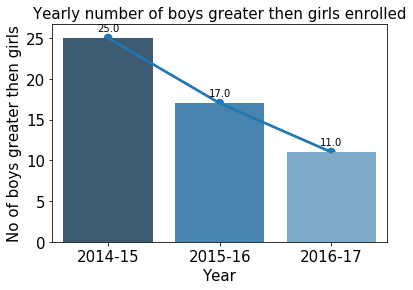

In [23]:
#bar and poin plot to show gradual decrese in number of biys greater then girls yearly
plt.subplot(1,1,1)
ax = sns.barplot(x='year',y='No_of_boys_greater_than_girls',data = no_boys_girls_greater,palette="Blues_d")
sns.pointplot(x = 'year', y = 'No_of_boys_greater_than_girls',data = no_boys_girls_greater)
plt.xlabel('Year',fontsize = 15)
plt.ylabel('No of boys greater then girls',fontsize = 15)
plt.title('Yearly number of boys greater then girls enrolled',fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
rects = ax.patches

# For each bar: Place a label
for rect in rects:
    # Get X and Y placement of label from rect.
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2

    # Number of points between bar and label. Change to your liking.
    space = 5
    # Vertical alignment for positive values
    va = 'bottom'

    # If value of bar is negative: Place label below bar
    if y_value < 0:
        # Invert space to place label below
        space *= -1
        # Vertically align label at top
        va = 'top'

    # Use Y value as label and format number with one decimal place
    label = "{:.1f}".format(y_value)

    # Create annotation
    plt.annotate(
        label,                      # Use `label` as label
        (x_value, y_value),         # Place label at end of the bar
        xytext=(0, space),          # Vertically shift label by `space`
        textcoords="offset points", # Interpret `xytext` as offset in points
        ha='center',                # Horizontally center label
        va=va)                      # Vertically align label differently for
                                    # positive and negative values.



**Number of girls enrolled each year greater then boys are increasing in recent year**

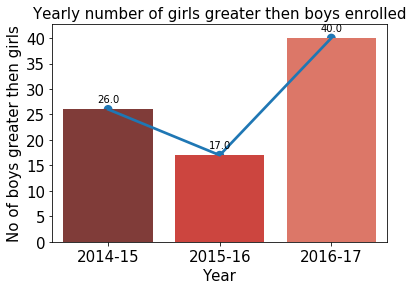

In [24]:
ax = sns.barplot(x='year',y='No_of_girls_greater_than_boys',data = no_boys_girls_greater,palette="Reds_d")
sns.pointplot(x = 'year', y = 'No_of_girls_greater_than_boys',data = no_boys_girls_greater)
plt.xlabel('Year',fontsize = 15)
plt.ylabel('No of boys greater then girls',fontsize = 15)
plt.title('Yearly number of girls greater then boys enrolled',fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
rects = ax.patches

# For each bar: Place a label
for rect in rects:
    # Get X and Y placement of label from rect.
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2

    # Number of points between bar and label. Change to your liking.
    space = 5
    # Vertical alignment for positive values
    va = 'bottom'

    # If value of bar is negative: Place label below bar
    if y_value < 0:
        # Invert space to place label below
        space *= -1
        # Vertically align label at top
        va = 'top'

    # Use Y value as label and format number with one decimal place
    label = "{:.1f}".format(y_value)

    # Create annotation
    plt.annotate(
        label,                      # Use `label` as label
        (x_value, y_value),         # Place label at end of the bar
        xytext=(0, space),          # Vertically shift label by `space`
        textcoords="offset points", # Interpret `xytext` as offset in points
        ha='center',                # Horizontally center label
        va=va)                      # Vertically align label differently for
                                    # positive and negative values.



  ###  Analyzing total number of students appeared in annual exams:
       1. District wise
       2. Gender wise
       3. Yearly

** The below pie charts depict that number of girls appearig for annual exams is greater than 50% in subsequant years and gradually number of boys appearing for annual exam are decreasing with increase in years and percentage of boys in annual exam is always less than 50% **

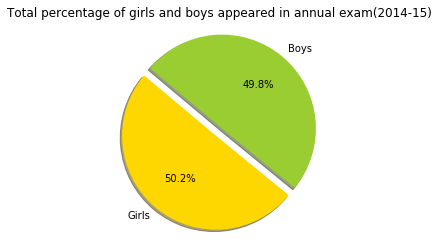

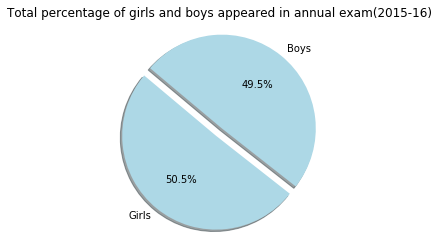

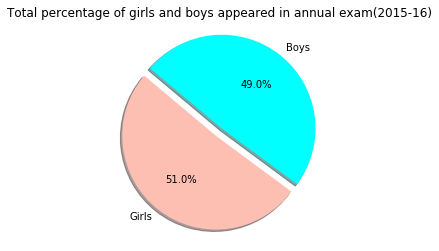

In [25]:

import matplotlib.pyplot as plt
 
# Data to plot
labels = 'Girls', 'Boys'
sizes = [annual_result_2014_15['Total Girls'].sum(), annual_result_2014_15['Total Boys'].sum()]
colors = ['gold', 'yellowgreen']
explode = (0.1, 0)  # explode 1st slice
 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Total percentage of girls and boys appeared in annual exam(2014-15)')
plt.axis('equal')
plt.show()

labels = 'Girls', 'Boys'
sizes = [annual_result_2015_16['Total Girls'].sum(), annual_result_2015_16['Total Boys'].sum()]
colors = ['lightblue', 'lightblue']
explode = (0.1, 0)  # explode 1st slice
 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Total percentage of girls and boys appeared in annual exam(2015-16)')
plt.axis('equal')
plt.show()

labels = 'Girls', 'Boys'
sizes = [annual_result_2016_17['Total Girls'].sum(), annual_result_2016_17['Total Boys'].sum()]
colors = ['#FEBFB3', 'cyan']
explode = (0.1, 0)  # explode 1st slice
 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Total percentage of girls and boys appeared in annual exam(2015-16)')
plt.axis('equal')
plt.show()

** Percentage of students appeared in exams from 2015 to 2017 have been increased from students appeared in annual exam in 2014-15  **

In [26]:
students_appeared_enrolled = pd.DataFrame()
students_appeared_enrolled['Year'] = ['2014-15','2015-16','2016-17']
students_appeared_enrolled['Enrollment'] = [annual_result_2014_15['Total Enrollment'].sum(),annual_result_2015_16['Total Enrollment'].sum(),annual_result_2016_17['Total Enrollment'].sum()]
students_appeared_enrolled['Appeared'] = [annual_result_2014_15['Total Appeared'].sum(),annual_result_2015_16['Total Appeared'].sum(),annual_result_2016_17['Total Appeared'].sum()]
students_appeared_enrolled['Total_differenc'] = [annual_result_2014_15['Total Enrollment'].sum()-annual_result_2014_15['Total Appeared'].sum(),annual_result_2015_16['Total Enrollment'].sum()-annual_result_2015_16['Total Appeared'].sum(),annual_result_2016_17['Total Enrollment'].sum()-annual_result_2016_17['Total Appeared'].sum()]
students_appeared_enrolled['Per_Appeared'] = [(annual_result_2014_15['Total Appeared'].sum()/annual_result_2014_15['Total Enrollment'].sum())*100,(annual_result_2015_16['Total Appeared'].sum()/annual_result_2015_16['Total Enrollment'].sum())*100,(annual_result_2016_17['Total Appeared'].sum()/annual_result_2016_17['Total Enrollment'].sum())*100]
students_appeared_enrolled

,Year,Enrollment,Appeared,Total_differenc,Per_Appeared
0,2014-15,4845840.0,4605182.0,240658.0,95.033720
1,2015-16,4580053.0,4415637.0,164416.0,96.410173
2,2016-17,4353251.0,4169389.0,183862.0,95.776444


Text(0.5,1,'Total students enrolled and appeared in annual exam')

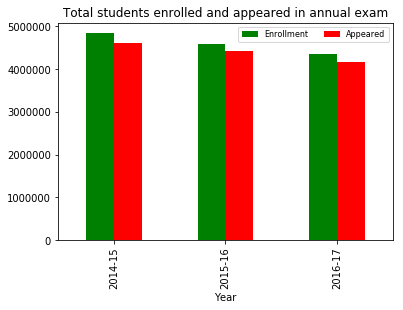

In [27]:
students_appeared_enrolled.plot(x = 'Year', y = ['Enrollment','Appeared'],kind = 'bar',color = 'green_d')
plt.legend(ncol = 2,fontsize = 8)
plt.title('Total students enrolled and appeared in annual exam')

** There are some students who are getting enrolled in sxhools but are not appearing in annual examintaion following is the difference between students enrolled and appeared in examination in all three yeas **

In [28]:
df_diff_appeared = pd.DataFrame()
df_diff_appeared['District / Block Name'] = annual_result_2014_15['District / Block Name']
df_diff_appeared['Difference_enrollment_appeared_2014_15'] = (annual_result_2014_15['Total Enrollment']-annual_result_2014_15['Total Appeared'])
df_diff_appeared['Difference_enrollment_appeared_2015_16'] = (annual_result_2015_16['Total Enrollment']-annual_result_2015_16['Total Appeared'])
df_diff_appeared['Difference_enrollment_appeared_2016_17'] = (annual_result_2016_17['Total Enrollment']-annual_result_2016_17['Total Appeared'])

In [29]:
df_diff_appeared.head()

,District / Block Name,Difference_enrollment_appeared_2014_15,Difference_enrollment_appeared_2015_16,Difference_enrollment_appeared_2016_17
1,AGAR MALWA,4322.0,738.0,805.0
2,ALIRAJPUR,27235.0,18449.0,19626.0
3,ANUPPUR,1070.0,505.0,781.0
4,ASHOKNAGAR,841.0,458.0,979.0
5,BALAGHAT,3120.0,2031.0,3634.0


** Districts having Minimum difference between students enrolled and students appeared in final exam in three years from 2014 to 2017 are Mandsaur, Datia, Narsinghpur **

** Districts having maximum difference between students enrolled and students appeared in final exam in three yers from 2014 to 2017 are Alirajpur and jhabua been the district with greatest difference twice **

In [30]:
min_difference_enrollment_appeared_2014_15 = df_diff_appeared['Difference_enrollment_appeared_2014_15'].min()
min_difference_enrollment_appeared_2015_16 = df_diff_appeared['Difference_enrollment_appeared_2015_16'].min()
min_difference_enrollment_appeared_2016_17 = df_diff_appeared['Difference_enrollment_appeared_2016_17'].min()
max_difference_enrollment_appeared_2014_15 = df_diff_appeared['Difference_enrollment_appeared_2014_15'].max()
max_difference_enrollment_appeared_2015_16 = df_diff_appeared['Difference_enrollment_appeared_2015_16'].max()
max_difference_enrollment_appeared_2016_17 = df_diff_appeared['Difference_enrollment_appeared_2016_17'].max()
min_district_2014_15 = df_diff_appeared[df_diff_appeared['Difference_enrollment_appeared_2014_15']==min_difference_enrollment_appeared_2014_15]['District / Block Name'].values[0]
min_district_2015_16 = df_diff_appeared[df_diff_appeared['Difference_enrollment_appeared_2015_16']==min_difference_enrollment_appeared_2015_16]['District / Block Name'].values[0]
min_district_2016_17 = df_diff_appeared[df_diff_appeared['Difference_enrollment_appeared_2016_17']==min_difference_enrollment_appeared_2016_17]['District / Block Name'].values[0]
max_district_2014_15 = df_diff_appeared[df_diff_appeared['Difference_enrollment_appeared_2014_15']==max_difference_enrollment_appeared_2014_15]['District / Block Name'].values[0]
max_district_2015_16 = df_diff_appeared[df_diff_appeared['Difference_enrollment_appeared_2015_16']==max_difference_enrollment_appeared_2015_16]['District / Block Name'].values[0]
max_district_2016_17 = df_diff_appeared[df_diff_appeared['Difference_enrollment_appeared_2016_17']==max_difference_enrollment_appeared_2016_17]['District / Block Name'].values[0]
max_min = pd.DataFrame()
max_min['Year'] = ['2014-15','2015-16','2016-17']
max_min['Min diff enrollment and apppeared District name'] = [min_district_2014_15,min_district_2015_16,min_district_2016_17]
max_min['Max diff enrollment and appeared District name'] = [max_district_2014_15,max_district_2015_16,max_district_2016_17]
max_min

,Year,Min diff enrollment and apppeared District name,Max diff enrollment and appeared District name
0,2014-15,MANDSAUR,ALIRAJPUR
1,2015-16,DATIA,JHABUA
2,2016-17,NARSINGHPUR,JHABUA


** In 3 years minmum difference between total students enrolled and appeared is more than 380 **

  ###  Analyzing total number of students in different grades based on annual exam results:
       1. District wise
       2. Gender wise
       3. Yearly

In [31]:
Total_A_Grade_Students_2014_15 = annual_result_2014_15['A Grade Boys'].sum()+annual_result_2014_15['A Grade Girls'].sum()
Total_B_Grade_Students_2014_15 = annual_result_2014_15['B Grade Boys'].sum()+annual_result_2014_15['B Grade Girls'].sum()
Total_C_Grade_Students_2014_15 = annual_result_2014_15['C Grade Boys'].sum()+annual_result_2014_15['C Grade Girls'].sum()
Total_D_Grade_Students_2014_15 = annual_result_2014_15['D Grade Boys'].sum()+annual_result_2014_15['D Grade Girls'].sum()
Total_E_Grade_Students_2014_15 = annual_result_2014_15['E Grade Boys'].sum()+annual_result_2014_15['E Grade Girls'].sum()
Total_A_Grade_Students_2015_16 = annual_result_2015_16['A Grade Boys'].sum()+annual_result_2015_16['A Grade Girls'].sum()
Total_B_Grade_Students_2015_16 = annual_result_2015_16['B Grade Boys'].sum()+annual_result_2015_16['B Grade Girls'].sum()
Total_C_Grade_Students_2015_16 = annual_result_2015_16['C Grade Boys'].sum()+annual_result_2015_16['C Grade Girls'].sum()
Total_D_Grade_Students_2015_16 = annual_result_2015_16['D Grade Boys'].sum()+annual_result_2015_16['D Grade Girls'].sum()
Total_E_Grade_Students_2015_16 = annual_result_2015_16['E Grade Boys'].sum()+annual_result_2015_16['E Grade Girls'].sum()
Total_A_Grade_Students_2016_17 = annual_result_2016_17['A Grade Boys'].sum()+annual_result_2016_17['A Grade Girls'].sum()
Total_B_Grade_Students_2016_17 = annual_result_2016_17['B Grade Boys'].sum()+annual_result_2016_17['B Grade Girls'].sum()
Total_C_Grade_Students_2016_17 = annual_result_2016_17['C Grade Boys'].sum()+annual_result_2016_17['C Grade Girls'].sum()
Total_D_Grade_Students_2016_17 = annual_result_2016_17['D Grade Boys'].sum()+annual_result_2016_17['D Grade Girls'].sum()
Total_E_Grade_Students_2016_17 = annual_result_2016_17['E Grade Boys'].sum()+annual_result_2016_17['E Grade Girls'].sum()

In [32]:
per_A_grade_students_2014_15 = (Total_A_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100
per_B_grade_students_2014_15 = (Total_B_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100
per_C_grade_students_2014_15 = (Total_C_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100
per_D_grade_students_2014_15 = (Total_D_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100
per_E_grade_students_2014_15 = (Total_E_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100
per_A_grade_students_2015_16 = (Total_A_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100
per_B_grade_students_2015_16 = (Total_B_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100
per_C_grade_students_2015_16 = (Total_C_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100
per_D_grade_students_2015_16 = (Total_D_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100
per_E_grade_students_2015_16 = (Total_E_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100
per_A_grade_students_2016_17 = (Total_A_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100
per_B_grade_students_2016_17 = (Total_B_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100
per_C_grade_students_2016_17 = (Total_C_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100
per_D_grade_students_2016_17 = (Total_D_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100
per_E_grade_students_2016_17 = (Total_E_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100

In [33]:
df_grade_total = pd.DataFrame({'year':['2014-15','2015-16','2016-17']})

In [34]:
df_grade_total['A Grade'] = [Total_A_Grade_Students_2014_15,Total_A_Grade_Students_2015_16,Total_A_Grade_Students_2016_17]
df_grade_total['B Grade'] = [Total_B_Grade_Students_2014_15,Total_B_Grade_Students_2015_16,Total_B_Grade_Students_2016_17]
df_grade_total['C Grade'] = [Total_C_Grade_Students_2014_15,Total_C_Grade_Students_2015_16,Total_C_Grade_Students_2016_17]
df_grade_total['D Grade'] = [Total_D_Grade_Students_2014_15,Total_D_Grade_Students_2015_16,Total_D_Grade_Students_2016_17]
df_grade_total['E Grade'] = [Total_E_Grade_Students_2014_15,Total_E_Grade_Students_2015_16,Total_E_Grade_Students_2016_17]
df_grade_total['% A Grade'] = [(Total_A_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100, (Total_A_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100,(Total_A_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100]
df_grade_total['% B Grade'] = [(Total_B_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100,(Total_B_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100, (Total_B_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100]
df_grade_total['% C Grade'] = [(Total_C_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100,(Total_C_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100,(Total_C_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100]
df_grade_total['% D Grade'] = [(Total_D_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100,(Total_D_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100,(Total_D_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100]
df_grade_total['% E Grade'] = [(Total_E_Grade_Students_2014_15/annual_result_2014_15['Total Appeared'].sum())*100,(Total_E_Grade_Students_2015_16/annual_result_2015_16['Total Appeared'].sum())*100,(Total_E_Grade_Students_2016_17/annual_result_2016_17['Total Appeared'].sum())*100]
df_grade_total

,year,A Grade,B Grade,C Grade,D Grade,E Grade,% A Grade,% B Grade,% C Grade,% D Grade,% E Grade
0,2014-15,598491.0,1974675.0,1923953.0,102727.0,5336.0,12.996034,42.879413,41.778001,2.230683,0.115869
1,2015-16,629946.0,1991591.0,1730101.0,61172.0,2827.0,14.266254,45.103141,39.181233,1.385349,0.064022
2,2016-17,605058.0,1786783.0,1693312.0,80715.0,3521.0,14.511910,42.854792,40.612953,1.935895,0.084449


** Amongst all 5 grades highest number of students are of B Grade in all three years(2014-17) constituiting of more than 40% and less than 46% of total students appeared in exams. Highest number of students in B grade is in 2015-16 year**
** Second highest number of students are of C grade constituiting of more than 39% and less than 42% **
** In third position students of A Grade comes which constituite of about 15% of total students appeared in exams **
** D grade students constituite of about 2 % of total students appeared in exams and at the last E Grade students constitute of about 0.1 % of total students appeared in exams. Number of E grade students are decreasing in gradual years **

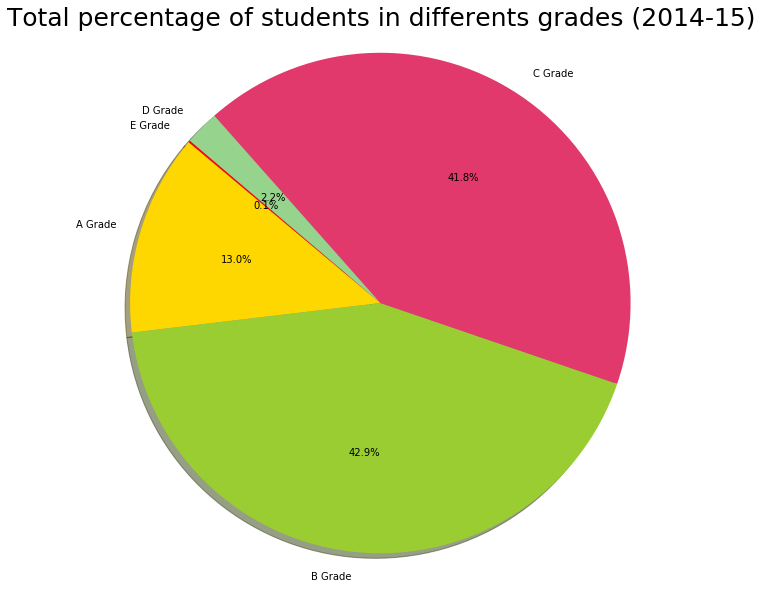

In [35]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,10))
# Data to plot
labels = 'A Grade', 'B Grade','C Grade','D Grade','E Grade'
sizes = [Total_A_Grade_Students_2014_15,Total_B_Grade_Students_2014_15,Total_C_Grade_Students_2014_15,Total_D_Grade_Students_2014_15,Total_E_Grade_Students_2014_15]
colors = ['gold', 'yellowgreen','#E1396C','#96D38C','red']
explode = (0, 0, 0, 0, 0)  # explode 1st slice

 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Total percentage of students in differents grades (2014-15)',fontsize = 25)

plt.axis('equal')
plt.show()



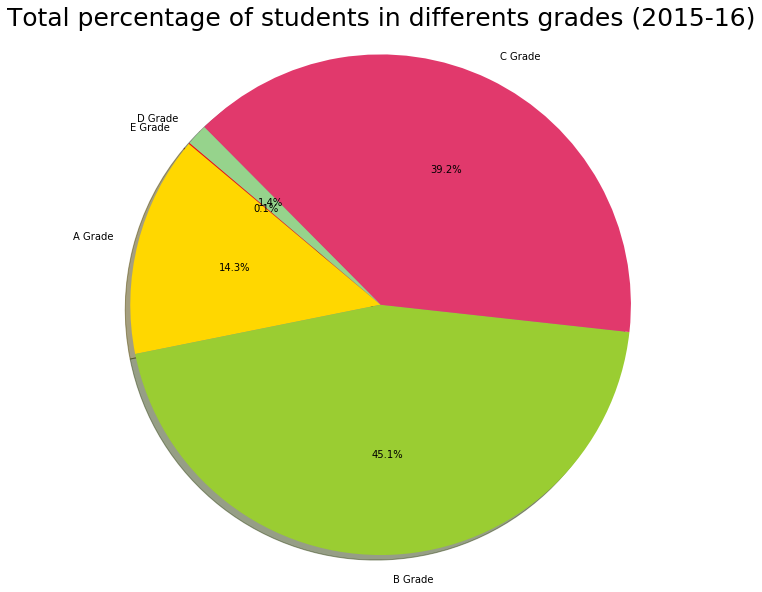

In [36]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,10))
# Data to plot
labels = 'A Grade', 'B Grade','C Grade','D Grade','E Grade'
sizes = [Total_A_Grade_Students_2015_16,Total_B_Grade_Students_2015_16,Total_C_Grade_Students_2015_16,Total_D_Grade_Students_2015_16,Total_E_Grade_Students_2015_16]
colors = ['gold', 'yellowgreen','#E1396C','#96D38C','red']
explode = (0, 0, 0, 0, 0)  # explode 1st slice

 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Total percentage of students in differents grades (2015-16)',fontsize = 25)

plt.axis('equal')
plt.show()

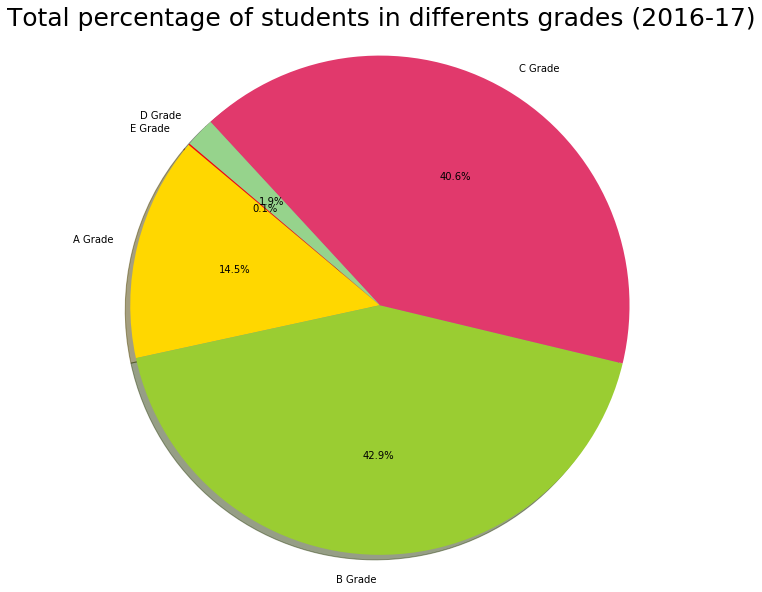

In [37]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,10))
# Data to plot
labels = 'A Grade', 'B Grade','C Grade','D Grade','E Grade'
sizes = [Total_A_Grade_Students_2016_17,Total_B_Grade_Students_2016_17,Total_C_Grade_Students_2016_17,Total_D_Grade_Students_2016_17,Total_E_Grade_Students_2016_17]
colors = ['gold', 'yellowgreen','#E1396C','#96D38C','red']
explode = (0, 0, 0, 0, 0)  # explode 1st slice

 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Total percentage of students in differents grades (2016-17)',fontsize = 25)

plt.axis('equal')
plt.show()

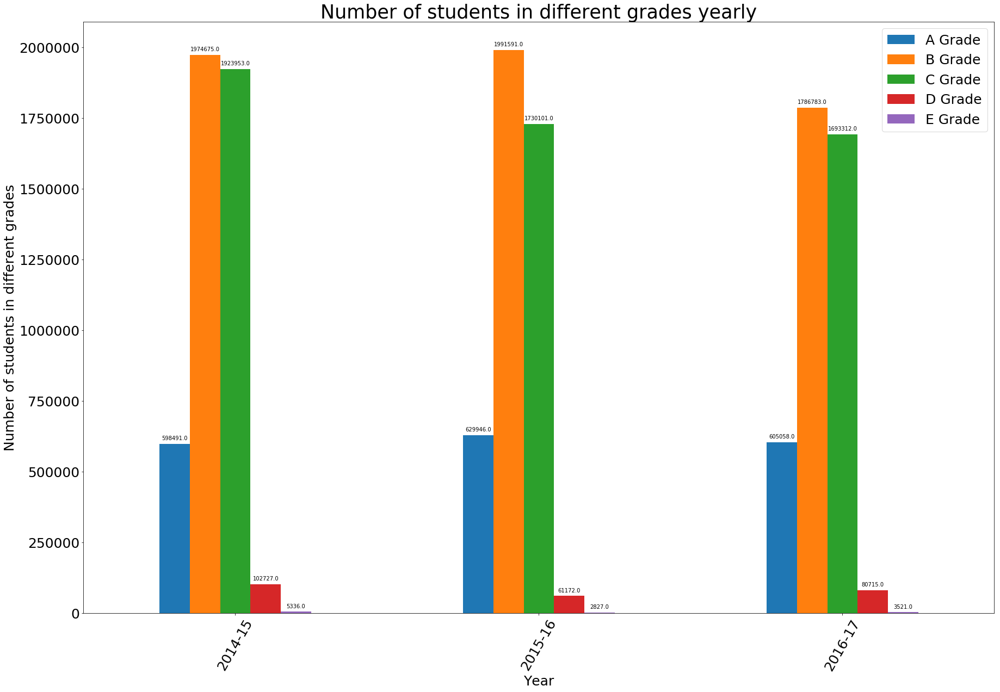

In [38]:
ax= df_grade_total.plot(x = 'year', y = ['A Grade','B Grade','C Grade','D Grade','E Grade'],kind = 'bar',figsize = (30,20))
plt.legend(fontsize = 25)
plt.xticks(fontsize = 25,rotation = 60)
plt.yticks(fontsize = 25)
plt.ylabel('Number of students in different grades',fontsize = 25)
plt.xlabel('Year',fontsize = 25)
plt.title('Number of students in different grades yearly',fontsize = 35)
rects = ax.patches

# For each bar: Place a label
for rect in rects:
    # Get X and Y placement of label from rect.
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2

    # Number of points between bar and label. Change to your liking.
    space = 5
    # Vertical alignment for positive values
    va = 'bottom'

    # If value of bar is negative: Place label below bar
    if y_value < 0:
        # Invert space to place label below
        space *= -1
        # Vertically align label at top
        va = 'top'

    # Use Y value as label and format number with one decimal place
    label = "{:.1f}".format(y_value)

    # Create annotation
    plt.annotate(
        label,                      # Use `label` as label
        (x_value, y_value),         # Place label at end of the bar
        xytext=(0, space),          # Vertically shift label by `space`
        textcoords="offset points", # Interpret `xytext` as offset in points
        ha='center',                # Horizontally center label
        va=va)                      # Vertically align label differently for
                                    # positive and negative values.




 ** maximum number of A and B grade students are in yer :2015-2016 **
   
   ** maximum number of C, D and E Grade students are in year : 2014-2015 **

In [39]:
#find percentage of girls and boys constituiting a particular grade
per_Grades_2014_15= (annual_result_2014_15[['Total Boys','Total Girls','A Grade Boys','A Grade Girls','B Grade Boys','B Grade Girls','C Grade Boys','C Grade Girls','D Grade Boys','D Grade Girls','E Grade Boys','E Grade Girls',]].div(annual_result_2014_15['Total Appeared'], axis=0))*100
per_Grades_2015_16= (annual_result_2014_15[['Total Boys','Total Girls','A Grade Boys','A Grade Girls','B Grade Boys','B Grade Girls','C Grade Boys','C Grade Girls','D Grade Boys','D Grade Girls','E Grade Boys','E Grade Girls',]].div(annual_result_2015_16['Total Appeared'], axis=0))*100
per_Grades_2016_17= (annual_result_2014_15[['Total Boys','Total Girls','A Grade Boys','A Grade Girls','B Grade Boys','B Grade Girls','C Grade Boys','C Grade Girls','D Grade Boys','D Grade Girls','E Grade Boys','E Grade Girls',]].div(annual_result_2016_17['Total Appeared'], axis=0))*100

In [40]:
Total_gender_per = pd.DataFrame()

In [41]:
Total_gender_per['year'] = ['2014-15','2015-16','2016-17']

In [42]:
Total_per_A_grade_boys_2014_15  = (annual_result_2014_15['A Grade Boys'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_A_grade_girls_2014_15  = (annual_result_2014_15['A Grade Girls'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_B_grade_boys_2014_15  = (annual_result_2014_15['B Grade Boys'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_B_grade_girls_2014_15  = (annual_result_2014_15['B Grade Girls'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_C_grade_boys_2014_15  = (annual_result_2014_15['C Grade Boys'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_C_grade_girls_2014_15  = (annual_result_2014_15['C Grade Girls'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_D_grade_boys_2014_15  = (annual_result_2014_15['D Grade Boys'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_D_grade_girls_2014_15  = (annual_result_2014_15['D Grade Girls'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_E_grade_boys_2014_15  = (annual_result_2014_15['E Grade Boys'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100
Total_per_E_grade_girls_2014_15  = (annual_result_2014_15['E Grade Girls'].sum()/ annual_result_2014_15['Total Appeared'].sum())*100

Total_per_A_grade_boys_2015_16  = (annual_result_2015_16['A Grade Boys'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_A_grade_girls_2015_16  = (annual_result_2015_16['A Grade Girls'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_B_grade_boys_2015_16  = (annual_result_2015_16['B Grade Boys'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_B_grade_girls_2015_16  = (annual_result_2015_16['B Grade Girls'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_C_grade_boys_2015_16  = (annual_result_2015_16['C Grade Boys'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_C_grade_girls_2015_16  = (annual_result_2015_16['C Grade Girls'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_D_grade_boys_2015_16  = (annual_result_2015_16['D Grade Boys'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_D_grade_girls_2015_16  = (annual_result_2015_16['D Grade Girls'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_E_grade_boys_2015_16  = (annual_result_2015_16['E Grade Boys'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100
Total_per_E_grade_girls_2015_16  = (annual_result_2015_16['E Grade Girls'].sum()/ annual_result_2015_16['Total Appeared'].sum())*100

Total_per_A_grade_boys_2016_17  = (annual_result_2016_17['A Grade Boys'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_A_grade_girls_2016_17  = (annual_result_2016_17['A Grade Girls'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_B_grade_boys_2016_17  = (annual_result_2016_17['B Grade Boys'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_B_grade_girls_2016_17  = (annual_result_2016_17['B Grade Girls'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_C_grade_boys_2016_17  = (annual_result_2016_17['C Grade Boys'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_C_grade_girls_2016_17  = (annual_result_2016_17['C Grade Girls'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_D_grade_boys_2016_17  = (annual_result_2016_17['D Grade Boys'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_D_grade_girls_2016_17  = (annual_result_2016_17['D Grade Girls'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_E_grade_boys_2016_17  = (annual_result_2016_17['E Grade Boys'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100
Total_per_E_grade_girls_2016_17  = (annual_result_2016_17['E Grade Girls'].sum()/ annual_result_2016_17['Total Appeared'].sum())*100




In [43]:
Total_gender_per['% A Grade Boys'] = [Total_per_A_grade_boys_2014_15,Total_per_A_grade_boys_2015_16,Total_per_A_grade_boys_2016_17]
Total_gender_per['% A Grade Girls'] = [Total_per_A_grade_girls_2014_15,Total_per_A_grade_girls_2015_16,Total_per_A_grade_girls_2016_17]
Total_gender_per['% B Grade Boys'] = [Total_per_B_grade_boys_2014_15,Total_per_B_grade_boys_2015_16,Total_per_B_grade_boys_2016_17]
Total_gender_per['% B Grade Girls'] =  [Total_per_B_grade_girls_2014_15,Total_per_B_grade_girls_2015_16,Total_per_B_grade_girls_2016_17]
Total_gender_per['% C Grade Boys'] = [Total_per_C_grade_boys_2014_15,Total_per_C_grade_boys_2015_16 ,Total_per_C_grade_boys_2016_17]
Total_gender_per['% C Grade Girls'] = [Total_per_C_grade_girls_2014_15,Total_per_C_grade_girls_2015_16 ,Total_per_C_grade_girls_2016_17]
Total_gender_per['% D Grade Boys'] = [Total_per_D_grade_boys_2014_15,Total_per_D_grade_boys_2015_16,Total_per_D_grade_boys_2016_17]
Total_gender_per['% D Grade Girls'] = [Total_per_D_grade_girls_2014_15,Total_per_D_grade_girls_2015_16,Total_per_D_grade_girls_2016_17]
Total_gender_per['% E Grade Boys'] = [Total_per_E_grade_boys_2014_15,Total_per_E_grade_boys_2015_16,Total_per_E_grade_boys_2016_17]
Total_gender_per['% E Grade Girls'] = [Total_per_E_grade_girls_2014_15,Total_per_E_grade_girls_2015_16,Total_per_E_grade_girls_2016_17]

In [44]:
Total_gender_per

,year,% A Grade Boys,% A Grade Girls,% B Grade Boys,% B Grade Girls,% C Grade Boys,% C Grade Girls,% D Grade Boys,% D Grade Girls,% E Grade Boys,% E Grade Girls
0,2014-15,6.470906,6.525128,21.382260,21.497153,20.729843,21.048158,1.145796,1.084887,0.061322,0.054547
1,2015-16,6.977317,7.288937,22.345994,22.757147,19.415749,19.765483,0.710067,0.675282,0.034604,0.029418
2,2016-17,7.018726,7.493184,20.985761,21.869032,19.971272,20.641682,0.991560,0.944335,0.048904,0.035545


Text(0.5,1,'Year wise total percentage of different grades of students')

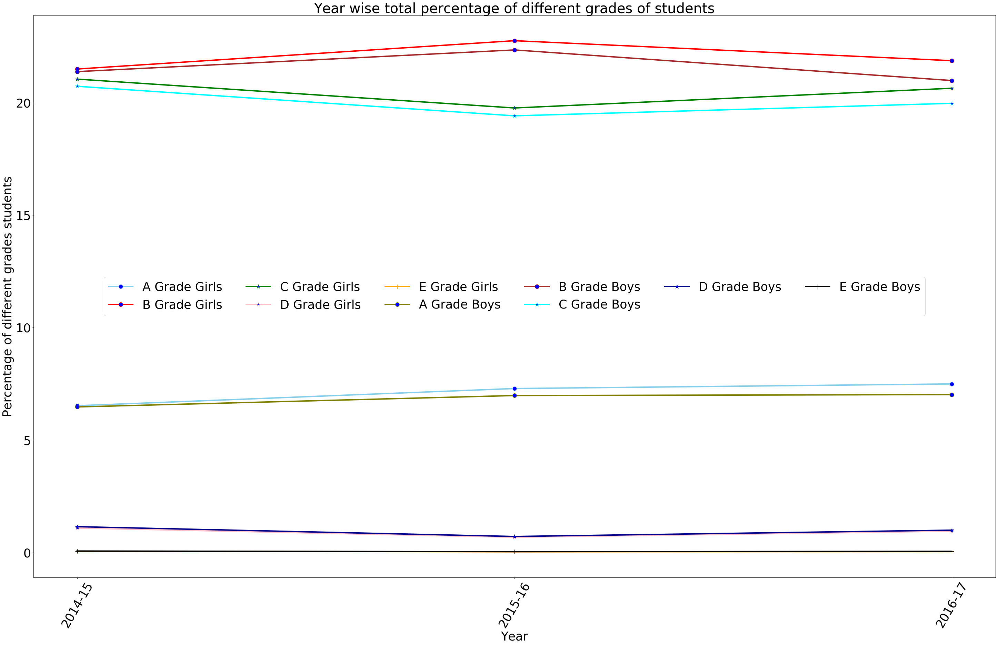

In [45]:
plt.figure(figsize = (50,30))
plt.plot( 'year', '% A Grade Girls', data = Total_gender_per, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4,label = 'A Grade Girls')
plt.plot( 'year', '% B Grade Girls', data=Total_gender_per, marker='o', markerfacecolor='blue', markersize=12, color='Red', linewidth=4,label = "B Grade Girls")
plt.plot( 'year', '% C Grade Girls', data=Total_gender_per, marker='*', markerfacecolor='blue', markersize=12, color='green', linewidth=4, label = 'C Grade Girls')
plt.plot( 'year', '% D Grade Girls', data=Total_gender_per, marker='*', markerfacecolor='blue', markersize=12, color='pink', linewidth=4,label = 'D Grade Girls')
plt.plot( 'year', '% E Grade Girls', data=Total_gender_per, marker='+', markerfacecolor='blue', markersize=12, color='orange', linewidth=4,label = 'E Grade Girls')
plt.plot( 'year', '% A Grade Boys', data = Total_gender_per, marker='o', markerfacecolor='blue', markersize=12, color='olive', linewidth=4,label = 'A Grade Boys')
plt.plot( 'year', '% B Grade Boys', data=Total_gender_per, marker='o', markerfacecolor='blue', markersize=12, color='brown', linewidth=4,label = "B Grade Boys")
plt.plot( 'year', '% C Grade Boys', data=Total_gender_per, marker='*', markerfacecolor='blue', markersize=12, color='cyan', linewidth=4, label = 'C Grade Boys')
plt.plot( 'year', '% D Grade Boys', data=Total_gender_per, marker='*', markerfacecolor='blue', markersize=12, color='darkblue', linewidth=4,label = 'D Grade Boys')
plt.plot( 'year', '% E Grade Boys', data=Total_gender_per, marker='+', markerfacecolor='blue', markersize=12, color='black', linewidth=4,label = 'E Grade Boys')
plt.legend(ncol = 6,loc = 'center',fontsize = 35)
plt.xlabel('Year',fontsize = 35)
plt.ylabel('Percentage of different grades students',fontsize = 35)
plt.yticks(fontsize = 35)
plt.xticks(rotation = 60,fontsize = 35)
plt.title('Year wise total percentage of different grades of students',fontsize = 40)


**Total percentage in three years of D and E grade gilrs and boys are almost same, total percentage of A grade girls is greater than A greate Boys by 0.84% ,total percentage of B grade girls is greater than B greate Boys by 1.4% ,total percentage of B grade girls is greater than B greate Boys by  1.33%**

** Grade which constituite highest percentage of students is B Grade, than C grade and followed by A,D and E Grades **

** In 2014-15 Chhindwara had maximum A Grade Girls and Boys , Rewa had maximum B grade girls and Morena had maximum B Grade boys, Shivpur had maximum C Grade girls and C Grade Boys,khargone had maximum D Grade Girls and Balaghat had maximum D Grade boys, Dhar had  maximum E grade girls and boys**

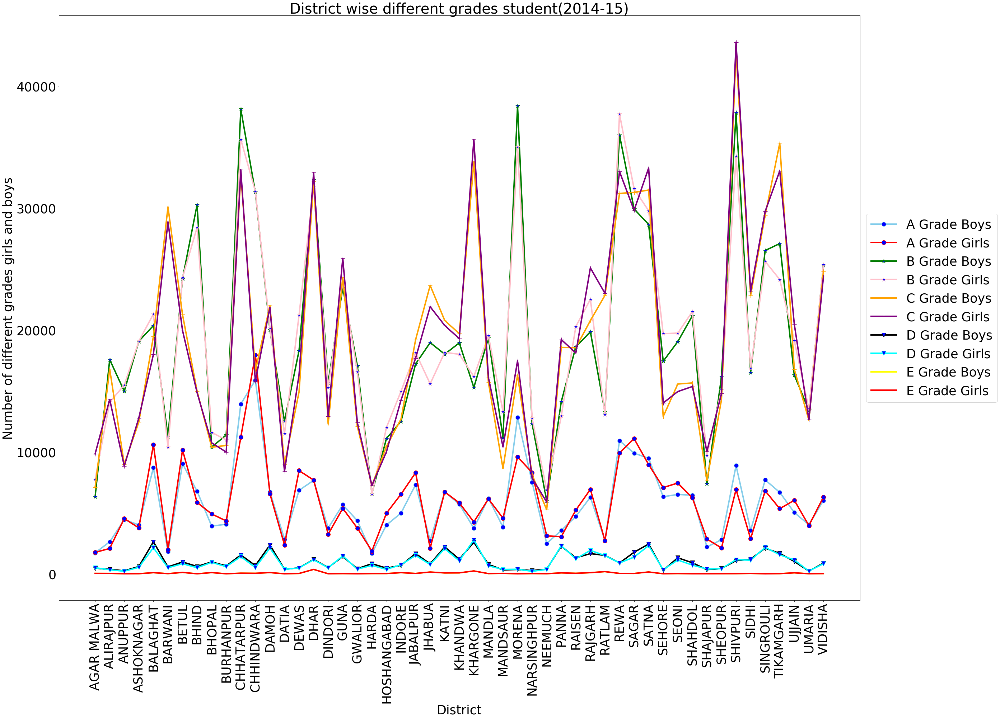

In [46]:
#line plots to compare different grades of girls and boys(2014-15)
plt.figure(figsize = (50,30))
ax = plt.subplot(1,1,1)

plt.plot( 'District / Block Name', 'A Grade Boys', data=annual_result_2014_15, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4,label = 'A Grade Boys')

plt.plot( 'District / Block Name', 'A Grade Girls', data=annual_result_2014_15, marker='o', markerfacecolor='blue', markersize=12, color='Red', linewidth=4,label = "A Grade Girls")
plt.plot( 'District / Block Name', 'B Grade Boys', data=annual_result_2014_15, marker='*', markerfacecolor='blue', markersize=12, color='green', linewidth=4, label = 'B Grade Boys')
plt.plot( 'District / Block Name', 'B Grade Girls', data=annual_result_2014_15, marker='*', markerfacecolor='blue', markersize=12, color='pink', linewidth=4,label = 'B Grade Girls')
plt.plot( 'District / Block Name', 'C Grade Boys', data=annual_result_2014_15, marker='+', markerfacecolor='blue', markersize=12, color='orange', linewidth=4,label = 'C Grade Boys')
plt.plot( 'District / Block Name', 'C Grade Girls', data=annual_result_2014_15, marker='+', markerfacecolor='blue', markersize=12, color='purple', linewidth=4,label = 'C Grade Girls')
plt.plot( 'District / Block Name', 'D Grade Boys', data=annual_result_2014_15, marker='v', markerfacecolor='blue', markersize=12, color='black', linewidth=4, label = 'D Grade Boys')
plt.plot( 'District / Block Name', 'D Grade Girls', data=annual_result_2014_15, marker='v', markerfacecolor='blue', markersize=12, color='cyan', linewidth=4,label = 'D Grade Girls')
plt.plot( 'District / Block Name', 'E Grade Girls', data=annual_result_2014_15, markerfacecolor='blue', markersize=12, color='yellow', linewidth=4,label = 'E Grade Boys')
plt.plot( 'District / Block Name', 'E Grade Girls', data=annual_result_2014_15, markerfacecolor='blue', markersize=12, color='red', linewidth=4,label = 'E Grade Girls')
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize = 35)

#plt.legend(ncol = 6,loc = 'upper right',fontsize = 35)
plt.xlabel('District',fontsize = 35)
plt.ylabel('Number of different grades girls and boys',fontsize = 35)
plt.yticks(fontsize = 35)
plt.xticks(rotation = 90,fontsize = 35)
plt.title('District wise different grades student(2014-15)',fontsize = 40)

plt.show()

** In 2015-16 Chhindwara had maximum A Grade Girls and Boys, Morena had maximum B grade Boys and Girls, Tikamgarh had maximum C grade boys and shivpuri had maximum C grade Girls, Satna had maximum D grade girls and boys,Betul had maximum E grade girls and boys **

Text(0.5,1,'District wise different grades student(2015-16)')

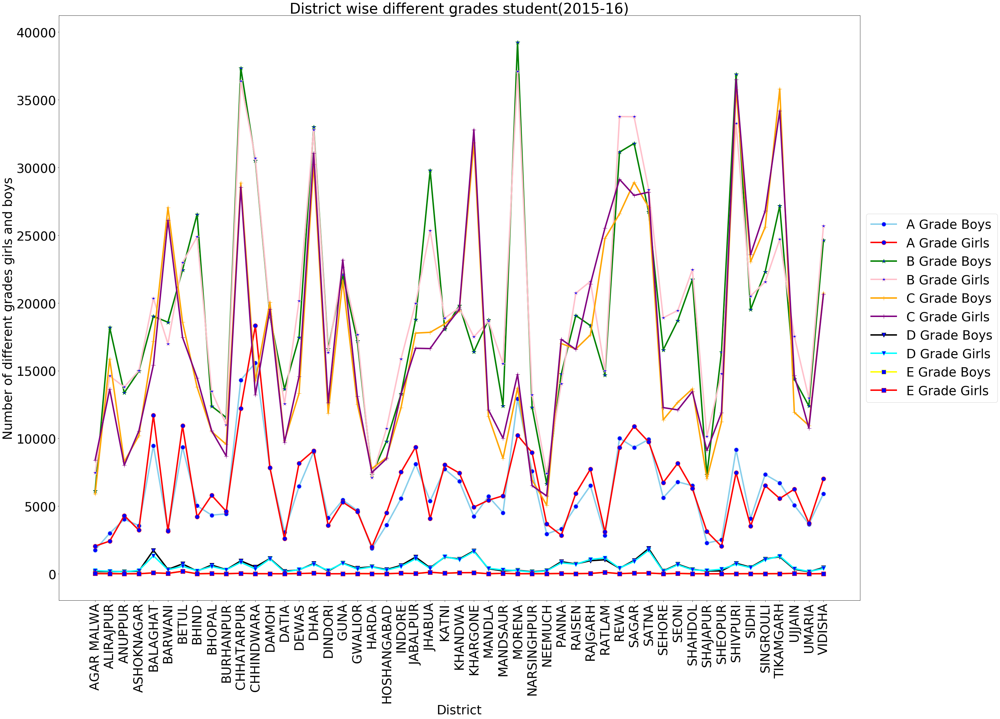

In [47]:
#line plots to compare different grades of girls and boys(2015-16)
plt.figure(figsize = (50,30))
ax = plt.subplot(1,1,1)
plt.plot( 'District / Block Name', 'A Grade Boys', data=annual_result_2015_16, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4,label = 'A Grade Boys')

plt.plot( 'District / Block Name', 'A Grade Girls', data=annual_result_2015_16, marker='o', markerfacecolor='blue', markersize=12, color='Red', linewidth=4,label = "A Grade Girls")
plt.plot( 'District / Block Name', 'B Grade Boys', data=annual_result_2015_16, marker='*', markerfacecolor='blue', markersize=12, color='green', linewidth=4, label = 'B Grade Boys')
plt.plot( 'District / Block Name', 'B Grade Girls', data=annual_result_2015_16, marker='*', markerfacecolor='blue', markersize=12, color='pink', linewidth=4,label = 'B Grade Girls')
plt.plot( 'District / Block Name', 'C Grade Boys', data=annual_result_2015_16, marker='+', markerfacecolor='blue', markersize=12, color='orange', linewidth=4,label = 'C Grade Boys')
plt.plot( 'District / Block Name', 'C Grade Girls', data=annual_result_2015_16, marker='+', markerfacecolor='blue', markersize=12, color='purple', linewidth=4,label = 'C Grade Girls')
plt.plot( 'District / Block Name', 'D Grade Boys', data=annual_result_2015_16, marker='v', markerfacecolor='blue', markersize=12, color='black', linewidth=4, label = 'D Grade Boys')
plt.plot( 'District / Block Name', 'D Grade Girls', data=annual_result_2015_16, marker='v', markerfacecolor='blue', markersize=12, color='cyan', linewidth=4,label = 'D Grade Girls')
plt.plot( 'District / Block Name', 'E Grade Girls', data=annual_result_2015_16, marker='s', markerfacecolor='blue', markersize=12, color='yellow', linewidth=4,label = 'E Grade Boys')
plt.plot( 'District / Block Name', 'E Grade Girls', data=annual_result_2015_16, marker='s', markerfacecolor='blue', markersize=12, color='Red', linewidth=4,label = 'E Grade Girls')
#plt.legend(ncol = 6,loc = 'upper right',fontsize = 35)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize = 35)

plt.xlabel('District',fontsize = 35)
plt.ylabel('Number of different grades girls and boys',fontsize = 35)
plt.yticks(fontsize = 35)
plt.xticks(rotation = 90,fontsize = 35)
plt.title('District wise different grades student(2015-16)',fontsize = 40)

**In 2016-17 Chhindwara had maximum A grade girls and boys, Morena had maximum B grade girls and boys, Khargone had maximum C grade girls and boys, Satna had maximum D grade girls and boys , Bhopal had maximum E grade boys and Katni had maximum E grade girls**

Text(0.5,1,'District wise different grades student(2016-17)')

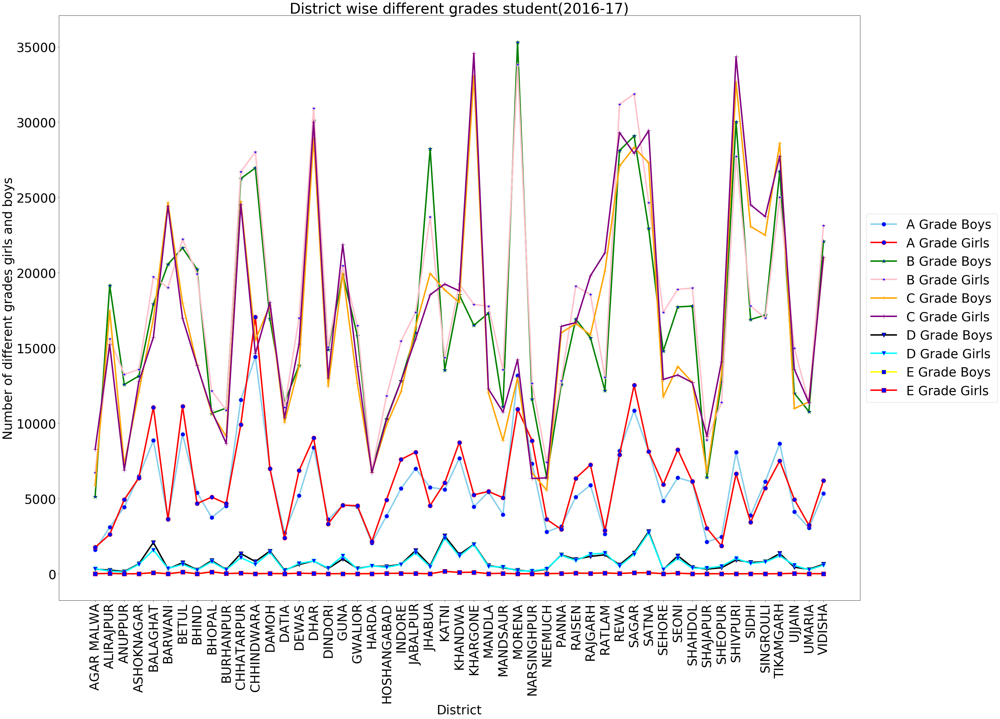

In [48]:
plt.figure(figsize = (50,30))
ax = plt.subplot(1,1,1)
plt.plot( 'District / Block Name', 'A Grade Boys', data=annual_result_2016_17, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4,label = 'A Grade Boys')

plt.plot( 'District / Block Name', 'A Grade Girls', data=annual_result_2016_17, marker='o', markerfacecolor='blue', markersize=12, color='Red', linewidth=4,label = "A Grade Girls")
plt.plot( 'District / Block Name', 'B Grade Boys', data=annual_result_2016_17, marker='*', markerfacecolor='blue', markersize=12, color='green', linewidth=4, label = 'B Grade Boys')
plt.plot( 'District / Block Name', 'B Grade Girls', data=annual_result_2016_17, marker='*', markerfacecolor='blue', markersize=12, color='pink', linewidth=4,label = 'B Grade Girls')
plt.plot( 'District / Block Name', 'C Grade Boys', data=annual_result_2016_17, marker='+', markerfacecolor='blue', markersize=12, color='orange', linewidth=4,label = 'C Grade Boys')
plt.plot( 'District / Block Name', 'C Grade Girls', data=annual_result_2016_17, marker='+', markerfacecolor='blue', markersize=12, color='purple', linewidth=4,label = 'C Grade Girls')
plt.plot( 'District / Block Name', 'D Grade Boys', data=annual_result_2016_17, marker='v', markerfacecolor='blue', markersize=12, color='black', linewidth=4, label = 'D Grade Boys')
plt.plot( 'District / Block Name', 'D Grade Girls', data=annual_result_2016_17, marker='v', markerfacecolor='blue', markersize=12, color='cyan', linewidth=4,label = 'D Grade Girls')
plt.plot( 'District / Block Name', 'E Grade Girls', data=annual_result_2016_17, marker='s', markerfacecolor='blue', markersize=12, color='yellow', linewidth=4,label = 'E Grade Boys')
plt.plot( 'District / Block Name', 'E Grade Girls', data=annual_result_2016_17, marker='s', markerfacecolor='blue', markersize=12, color='Red', linewidth=4,label = 'E Grade Girls')
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize = 35)

#plt.legend(ncol = 6,loc = 'upper right',fontsize = 35)
plt.xlabel('District',fontsize = 35)
plt.ylabel('Number of different grades girls and boys',fontsize = 35)
plt.yticks(fontsize = 35)
plt.xticks(rotation = 90,fontsize = 35)
plt.title('District wise different grades student(2016-17)',fontsize = 40)